# MSER: Implementation and Comparison with the OpenCV Version
Computational Vision course - A.Y. 2024/2025<br>
Sara Caviglia - 5163676, January 2026

### Specification
Maximally Stable Extrema Regions (MSER) implementation.  MSER is a type of local features we did not cover in class. Have a look at the <a href="https://en.wikipedia.org/wiki/Maximally_stable_extremal_regions">Wikipedia page</a> or the <a href="https://www.sciencedirect.com/science/article/abs/pii/S0262885604000435">original paper</a>. They have been very much used in text classification, as they carry shape information. You find them implemented in OpenCV. The goal of the project is to produce your own implementation, and provide a comparative analysis with the OpenCV version.
You may choose images from <a href="https://www.kaggle.com/datasets/trainingdatapro/license-plates-1-209-438-ocr-plates/data">this dataset</a> and discuss how MSER can be used as an initialization of a licence plates detection procedure.

### Imports

In [1]:
import cv2 as cv
from collections import defaultdict
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import time

### Core functions implemented

In [2]:
# Bin sort (bucket sort) implementation for pixel intensity sorting as requested in the original paper

def binsort(pixels, max_intensity):
    # pixels: list of [intensity, (i, j)]
    bins = [[] for _ in range(max_intensity + 1)]
    for pixel in pixels:
        bins[pixel[0]].append(pixel)
    sorted_pixels = []
    for b in bins:
        sorted_pixels.extend(b)
    return sorted_pixels

In [3]:
# Union-find implementation as requested in the original paper

class UnionFindDS:
	def __init__(self):
		self.parent = {}
		self.size = {}
		self.rank = {}
		self.history = {}
		self.coordinates = {}
		self.prev_variation = {}
		self.last_stable_area = {}
		self.best_snapshot = {}

	def makeset(self, x, intensity):
		if x not in self.parent:
			self.parent[x] = x
			self.size[x] = 1
			self.rank[x] = 0
			self.history[x] = [(intensity, 1)]
			self.coordinates[x] = [x]
			self.prev_variation[x] = float("inf")
			self.last_stable_area[x] = 0
			self.best_snapshot[x] = None

	def find(self, x):
		if self.parent[x] != x:
			self.parent[x] = self.find(self.parent[x])
		return self.parent[x]
	
	def unionbyrank(self, x, y, intensity):
		# r means root
		rx = self.find(x)
		ry = self.find(y)
		if rx == ry:
			return
		if self.rank[rx] < self.rank[ry]:
			(rx, ry) = (ry, rx)
		self.parent[ry] = rx
		self.size[rx] += self.size[ry]
		self.history[rx].append((intensity, self.size[rx]))
		self.coordinates[rx].extend(self.coordinates[ry])
		del self.coordinates[ry]
		self.last_stable_area[rx] = max(self.last_stable_area.get(rx, 0), self.last_stable_area.get(ry, 0))
		if self.rank[rx] == self.rank[ry]:
			self.rank[rx] += 1

In [4]:
# Implementation of the MSER class

class myMSER:
	def __init__(self, delta=5, min_area=60, max_area=14400, max_variation=0.25, min_diversity=0.2):
		self.delta = delta
		self.min_area = min_area
		self.max_area = max_area
		self.max_variation = max_variation
		self.min_diversity = min_diversity
	
	# auxiliary function
	def _get_area_at_delta(self, history, current_intensity):
		target_intensity = int(current_intensity) - int(self.delta) # cast to avoid warning
		for history_intensity, area in reversed(history):
			if history_intensity <= target_intensity:
				return area
		return None
	
	# non-maxima suppression for MSER regions
	def nmsMSER(self, candidate_regions, inclusion_threshold=0.8):
		if len(candidate_regions) == 0:
			return []
		# sort by variation (asccending, from more stable to less stable)
		candidate_regions = sorted(candidate_regions, key=lambda x: (x["variation"], x["area"]))
		final_regions = []

		# pre-computed to avoid redundant calculations
		for candidate in candidate_regions:
			candidate["set"] = set(map(tuple, candidate["coordinates"]))

		while candidate_regions:
			best = candidate_regions.pop(0)
			final_regions.append(best["coordinates"])

			best_set = best["set"]
			best_area = len(best_set)

			remaining_regions = []
			for region in candidate_regions:
				candidate_set = region["set"]
				candidate_area = len(candidate_set)
				# compute intersection
				intersection_size = len(best_set.intersection(candidate_set))
				if intersection_size == 0:
					remaining_regions.append(region)
					continue
				overlap_area = intersection_size / best_area
				if overlap_area > inclusion_threshold:
					difference = (max(best_area, candidate_area) - min(best_area, candidate_area)) / max(best_area, candidate_area)
					if difference < self.min_diversity:
						continue # they are too similar, we discard the candidate
				remaining_regions.append(region)
			candidate_regions = remaining_regions
		return final_regions

	def enumMSER(self, image):
		# the image needs to be grayscale
		gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
		h, w = gray.shape
		pixels = []

		# we create the union-find data structure
		uf = UnionFindDS()
		for i in range(h):
			for j in range(w):
				uf.makeset((i, j), gray[i, j])
				pixels.append([gray[i, j], (i, j)])

		sorted_pixels = binsort(pixels, 255)

		candidate_regions = []

		# we need to process intensity levels in batches
		intensity_batches = defaultdict(list)
		for intensity, (i, j) in sorted_pixels:
			intensity_batches[intensity].append((i, j))

		for intensity in range(256):
			pixels_at_intensity = intensity_batches.get(intensity, [])

			# perform union operations for all pixels at the current intensity
			for i, j in pixels_at_intensity:
				uf.makeset((i, j), intensity)

				# we check the neighbours
				for di, dj in [(-1, 0), (1, 0), (0, -1), (0, 1)]:
					ni, nj = i + di, j + dj
					if 0 <= ni < h and 0 <= nj < w:
						# we merge only pixels with similar intensities
						if gray[ni, nj] <= intensity:
							uf.unionbyrank((i, j), (ni, nj), intensity)

			# we track the active roots to avoid redundancy
			active_roots = set()
			for i, j in pixels_at_intensity:
				root = uf.find((i, j))
				active_roots.add(root)

			for root in active_roots:
				area_now = uf.size[root]
				
				# the area constraints
				if self.min_area <= area_now <= self.max_area:
					# we check the area looking at our history
					area_prev = self._get_area_at_delta(uf.history[root], intensity)
					if area_prev is not None:
						variation = (area_now - area_prev) / area_prev # normalized variation of our region
						# the variation constraints
						if variation <= self.max_variation:
							previous_variation = uf.prev_variation.get(root, float("inf"))
							# if the variation is decreasing, we update the best snapshot
							if variation < previous_variation:
								uf.best_snapshot[root] = (intensity, area_now, variation)
							# if the variation is increasing (the previous intensity was a local minima), we check the diversity constraint
							elif variation > previous_variation and uf.best_snapshot[root] is not None:
								best_intensity, best_area, best_variation = uf.best_snapshot[root]
								last_stable_area = uf.last_stable_area.get(root, 0)
								# we compute the diversity
								if best_area > 0:
									diversity = (best_area - last_stable_area) / best_area
								else:
									diversity = 0
								# the diversity constraints
								if diversity >= self.min_diversity:
									candidate_regions.append({
										"coordinates": list(uf.coordinates[root]),
										"variation": best_variation,
										"area": best_area
									})
									uf.last_stable_area[root] = best_area
								uf.best_snapshot[root] = None
							uf.prev_variation[root] = variation
		return candidate_regions
	
	# main function to be called for MSER detection (for the 1-pass approach)
	def one_pass(self, image):
		regions = self.enumMSER(image)
		final_regions = self.nmsMSER(regions, inclusion_threshold=0.8)
		return final_regions
	
	# main function to be called for MSER detection (for the 2-pass approach)
	def two_pass(self, image):
		regions_dark = self.enumMSER(image)
		regions_bright = self.enumMSER(255 - image)
		all_regions = regions_dark + regions_bright
		final_regions = self.nmsMSER(all_regions, inclusion_threshold=0.8)
		return final_regions

### Other functions

In [5]:
# VISUALIZATION FUNCTIONS for CUSTOM IMPLEMENTATION

def get_bounding_box(region):
	region_pts = np.array(region)
	ymin, xmin = region_pts.min(axis=0)
	ymax, xmax = region_pts.max(axis=0)
	return (xmin, ymin, xmax, ymax)

def visualize_mser_matplotlib(image, regions):
	fig, ax = plt.subplots(figsize=(10, 10))
	if len(image.shape) == 3:
		display_img = image[:, :, ::-1] # BGR to RGB (different standards for OpenCV and Matplotlib)
	else:
		display_img = image
	ax.imshow(display_img)
	for i, region in enumerate(regions):
		region_pts = np.array(region) # region as a list of (row, col) coordinates
		ax.scatter(region_pts[:, 1], region_pts[:, 0], s=1, alpha=1)
	ax.set_title(f"MSER Manual Implementation")
	ax.axis('off')
	plt.show()

def visualize_mser_contours(image, regions):
	fig, ax = plt.subplots(figsize=(10, 10))
	display_img = image[:, :, ::-1] # BGR to RGB (different standards for OpenCV and Matplotlib)
	ax.imshow(display_img)
	for region in regions:
		region_pts = np.array(region)
		hull = cv.convexHull(region_pts[:, ::-1]) # swap (row, col) to (x, y)
		hull = hull.reshape(-1, 2)
		polygon = plt.Polygon(hull, closed=True, fill=None, edgecolor='r', linewidth=1, alpha=1)
		ax.add_patch(polygon)
	plt.title("MSER Regions (Convex Hulls)")
	plt.axis('off')
	plt.show()

def visualize_mser_boxes(image, regions):
	fig, ax = plt.subplots(figsize=(10, 10))
	display_img = image[:, :, ::-1] # BGR to RGB (different standards for OpenCV and Matplotlib)
	ax.imshow(display_img)
	for region in regions:
		xmin, ymin, xmax, ymax = get_bounding_box(region)
		rect = Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none', alpha=1)
		ax.add_patch(rect)
	plt.title("MSER Regions (Bounding Boxes)")
	plt.axis('off')
	plt.show()

def visualize_mser_boxes_licenseplates(image, regions):
	fig, ax = plt.subplots(figsize=(10, 10))
	if len(image.shape) == 3:
		display_img = image[:, :, ::-1] # BGR to RGB (different standards for OpenCV and Matplotlib)
	else:
		display_img = image
	ax.imshow(display_img)
	for region in regions:
		xmin, ymin, xmax, ymax = get_bounding_box(region)
		rect = Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none', alpha=1)
		if abs(((xmax - xmin)/(ymax - ymin+1e-5)) - 4.7) <= 0.5: # 0.5 as tolerance
			ax.add_patch(rect)
	plt.title("MSER Regions (Bounding Boxes) with potential license plates")
	plt.axis('off')
	plt.show()

In [6]:
# VISUALIZATION FUNCTIONS for OPENCV IMPLEMENTATION

def visualize_mser_matplotlib_opencv(image, regions):
		fig, ax = plt.subplots(figsize=(10, 10))
		if len(image.shape) == 3:
			display_img = image[:, :, ::-1] # BGR to RGB (different standards for OpenCV and Matplotlib)
		else:
			display_img = image
		ax.imshow(display_img)
		for i, region in enumerate(regions):
			region_pts = np.array(region) # region as a list of (row, col) coordinates
			ax.scatter(region_pts[:, 0], region_pts[:, 1], s=1, alpha=1) # swapped rows/cols because of different implementation
		ax.set_title(f"MSER OpenCV Implementation")
		ax.axis('off')
		plt.show()

def visualize_mser_contours_opencv(image, regions):
	fig, ax = plt.subplots(figsize=(10, 10))
	display_img = image[:, :, ::-1] # BGR to RGB (different standards for OpenCV and Matplotlib)
	ax.imshow(display_img)
	for region in regions:
		hull = cv.convexHull(region)
		hull = hull.reshape(-1, 2)
		polygon = plt.Polygon(hull, closed=True, fill=None, edgecolor='r', linewidth=1, alpha=1)
		ax.add_patch(polygon)
	plt.title("MSER Regions (Convex Hulls) - OpenCV")
	plt.axis('off')
	plt.show()

def visualize_mser_boxes_opencv(image, regions):
	fig, ax = plt.subplots(figsize=(10, 10))
	ax.imshow(image[:, :, ::-1] if len(image.shape) == 3 else image, cmap='gray')
	for region in regions:
		ymin, xmin, ymax, xmax = get_bounding_box(region) # swapped rows/cols because of different implementation
		rect = Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none', alpha=1)
		ax.add_patch(rect)
	plt.title("MSER Regions (Bounding Boxes) - OpenCV")
	plt.axis('off')
	plt.show()

def visualize_mser_boxes_licenseplates_opencv(image, regions):
	fig, ax = plt.subplots(figsize=(10, 10))
	ax.imshow(image[:, :, ::-1] if len(image.shape) == 3 else image, cmap='gray')
	for region in regions:
		ymin, xmin, ymax, xmax = get_bounding_box(region) # swapped rows/cols because of different implementation
		rect = Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none', alpha=1)
		if abs(((xmax - xmin)/(ymax - ymin+1e-5)) - 4.7) <= 0.5: # 0.5 as tolerance
			ax.add_patch(rect)
	plt.title("MSER Regions (Bounding Boxes) with potential license plates - OpenCV")
	plt.axis('off')
	plt.show()

In [7]:
# COMPARISON FUNCTIONS

def comparison(my_regions, opencv_regions):
	my_set = set()
	for region in my_regions:
		for point in region:
			my_set.add((point[1], point[0]))
	opencv_set = set()
	for region in opencv_regions:
		points = region.reshape(-1, 2)
		for point in points:
			opencv_set.add(tuple(map(int, point))) # swapped rows/cols because of different implementation

	intersection = my_set.intersection(opencv_set)
	union = my_set.union(opencv_set)

	iou = len(intersection) / len(union) if len(union) > 0 else 0

	return iou

def comparison_custom(my_regions1, my_regions2):
	my_set1 = set()
	for region in my_regions1:
		for point in region:
			my_set1.add((point[1], point[0]))
	my_set2 = set()
	for region in my_regions2:
		for point in region:
			my_set2.add((point[1], point[0]))

	intersection = my_set1.intersection(my_set2)
	union = my_set1.union(my_set2)

	iou = len(intersection) / len(union) if len(union) > 0 else 0

	return iou

In [8]:
# TESTING THE IMPLEMENTATION

def test_custom_different_passes():
	image = cv.imread("images/test.jpg")
	# test with default parameters between custom (one-pass) and custom (two-pass) implementation
	my = myMSER()
	time_start_onepass = time.time()
	my_regions_one_pass = my.one_pass(image)
	time_end_onepass = time.time()
	time_onepass = time_end_onepass - time_start_onepass
	print(f"Custom one-pass MSER time: {time_onepass:.4f} seconds")
	number_of_regions_one_pass = len(my_regions_one_pass)
	print(f"Number of regions detected by custom one-pass MSER: {number_of_regions_one_pass}")

	time_start_twopass = time.time()
	my_regions_two_pass = my.two_pass(image)
	time_end_twopass = time.time()
	time_twopass = time_end_twopass - time_start_twopass
	print(f"Custom two-pass MSER time: {time_twopass:.4f} seconds")
	number_of_regions_two_pass = len(my_regions_two_pass)
	print(f"Number of regions detected by custom two-pass MSER: {number_of_regions_two_pass}")

	iou = comparison_custom(my_regions_one_pass, my_regions_two_pass)
	print(f"IoU between custom one-pass and two-pass MSER regions: {iou:.4f}")
	
	visualize_mser_matplotlib(image, my_regions_one_pass)
	visualize_mser_matplotlib(image, my_regions_two_pass)

	visualize_mser_contours(image, my_regions_one_pass)
	visualize_mser_contours(image, my_regions_two_pass)

	visualize_mser_boxes(image, my_regions_one_pass)
	visualize_mser_boxes(image, my_regions_two_pass)

	visualize_mser_boxes_licenseplates(image, my_regions_one_pass)
	visualize_mser_boxes_licenseplates(image, my_regions_two_pass)

	return number_of_regions_one_pass, number_of_regions_two_pass, time_onepass, time_twopass, iou

def test_custom_opencv():
	image = cv.imread("images/test.jpg")
	# test with default parameters between custom (two-pass) and OpenCV implementation
	time_start_custom = time.time()
	my = myMSER()
	my_regions = my.two_pass(image)
	time_end_custom = time.time()
	time_custom = time_end_custom - time_start_custom
	print(f"Custom two-pass MSER time: {time_custom:.4f} seconds")
	number_of_regions_custom = len(my_regions)
	print(f"Number of regions detected by custom two-pass MSER: {number_of_regions_custom}")

	time_start_opencv = time.time()
	mser = cv.MSER_create()
	image_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
	opencv_regions, _ = mser.detectRegions(image_gray)
	time_end_opencv = time.time()
	time_opencv = time_end_opencv - time_start_opencv
	print(f"OpenCV MSER time: {time_opencv:.4f} seconds")
	number_of_regions_opencv = len(opencv_regions)
	print(f"Number of regions detected by OpenCV MSER: {number_of_regions_opencv}")

	iou = comparison(my_regions, opencv_regions)
	print(f"IoU between custom and OpenCV MSER regions: {iou:.4f}")
	
	visualize_mser_matplotlib(image, my_regions)
	visualize_mser_matplotlib_opencv(image, opencv_regions)

	visualize_mser_contours(image, my_regions)
	visualize_mser_contours_opencv(image, opencv_regions)

	visualize_mser_boxes(image, my_regions)
	visualize_mser_boxes_opencv(image, opencv_regions)

	visualize_mser_boxes_licenseplates(image, my_regions)
	visualize_mser_boxes_licenseplates_opencv(image, opencv_regions)

	return number_of_regions_custom, number_of_regions_opencv, time_custom, time_opencv, iou

def test_custom_parameters(delta, min_area, max_area, max_variation, min_diversity):
	image = cv.imread("images/test.jpg")
	# test with custom parameters between custom (two-pass) and OpenCV implementation
	time_start_custom = time.time()
	my = myMSER(delta=delta, min_area=min_area, max_area=max_area, max_variation=max_variation, min_diversity=min_diversity)
	my_regions = my.two_pass(image)
	time_end_custom = time.time()
	time_custom = time_end_custom - time_start_custom
	print(f"Custom two-pass MSER time with custom parameters: {time_custom:.4f} seconds")
	number_of_regions_custom = len(my_regions)
	print(f"Number of regions detected by custom two-pass MSER with custom parameters: {number_of_regions_custom}")

	time_start_opencv = time.time()
	mser = cv.MSER_create(delta=delta, min_area=min_area, max_area=max_area, max_variation=max_variation, min_diversity=min_diversity)
	image_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
	opencv_regions, _ = mser.detectRegions(image_gray)
	time_end_opencv = time.time()
	time_opencv = time_end_opencv - time_start_opencv
	print(f"OpenCV MSER time with custom parameters: {time_opencv:.4f} seconds")
	number_of_regions_opencv = len(opencv_regions)
	print(f"Number of regions detected by OpenCV MSER with custom parameters: {number_of_regions_opencv}")

	iou = comparison(my_regions, opencv_regions)
	print(f"IoU between custom and OpenCV MSER regions with custom parameters: {iou:.4f}")
	
	visualize_mser_matplotlib(image, my_regions)
	visualize_mser_matplotlib_opencv(image, opencv_regions)

	visualize_mser_contours(image, my_regions)
	visualize_mser_contours_opencv(image, opencv_regions)

	visualize_mser_boxes(image, my_regions)
	visualize_mser_boxes_opencv(image, opencv_regions)

	visualize_mser_boxes_licenseplates(image, my_regions)
	visualize_mser_boxes_licenseplates_opencv(image, opencv_regions)

	return number_of_regions_custom, number_of_regions_opencv, time_custom, time_opencv, iou

### Experiments

Custom one-pass MSER time: 1.5145 seconds
Number of regions detected by custom one-pass MSER: 105
Custom two-pass MSER time: 2.9954 seconds
Number of regions detected by custom two-pass MSER: 173
IoU between custom one-pass and two-pass MSER regions: 0.3684


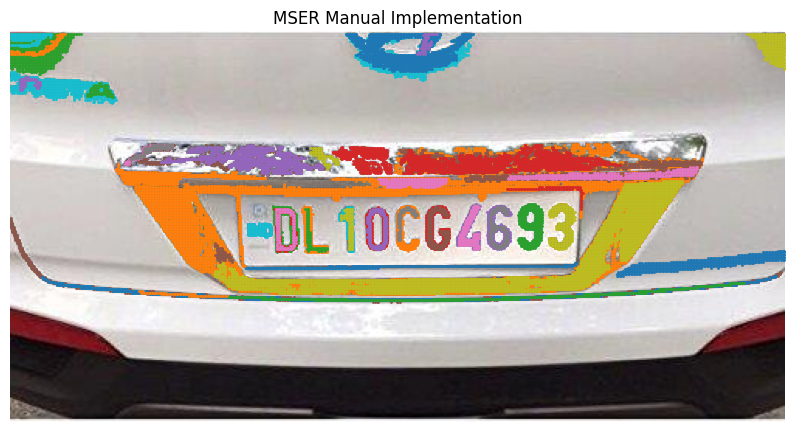

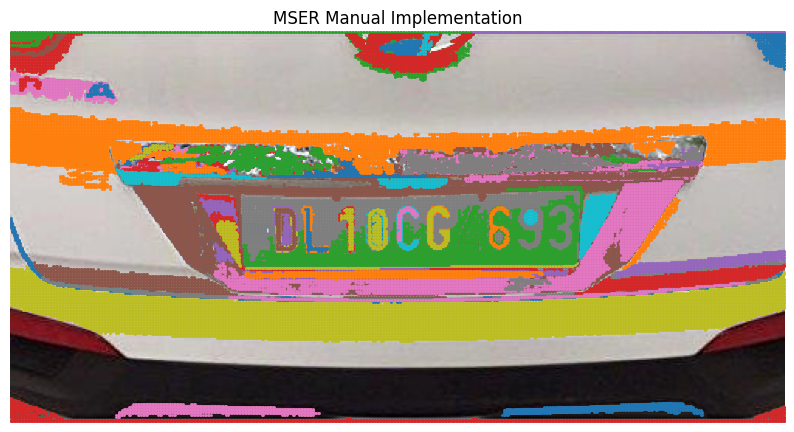

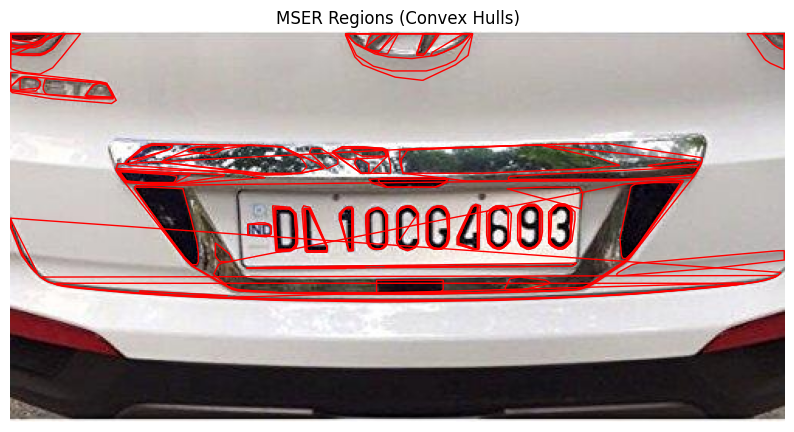

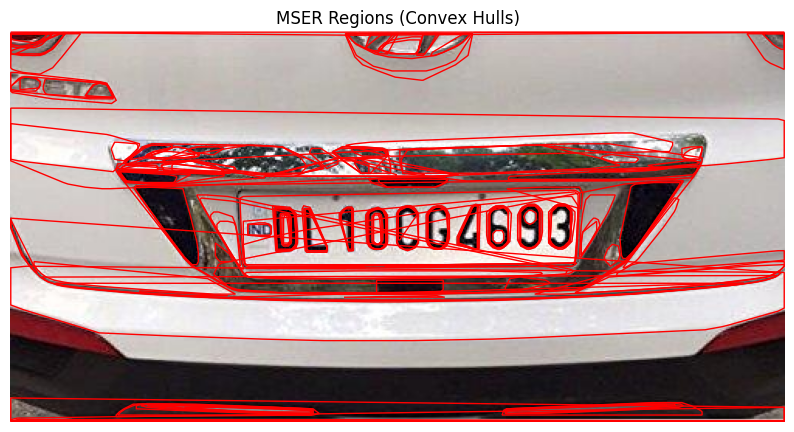

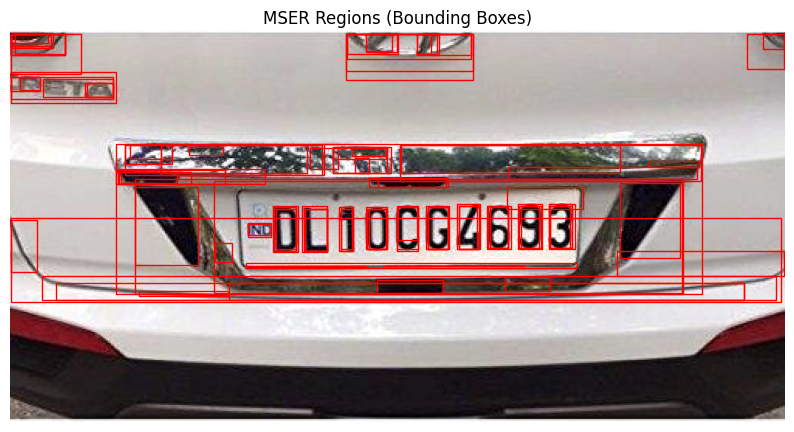

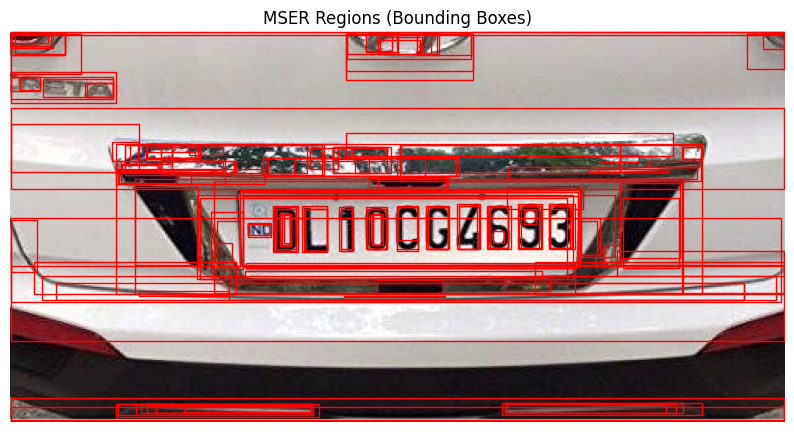

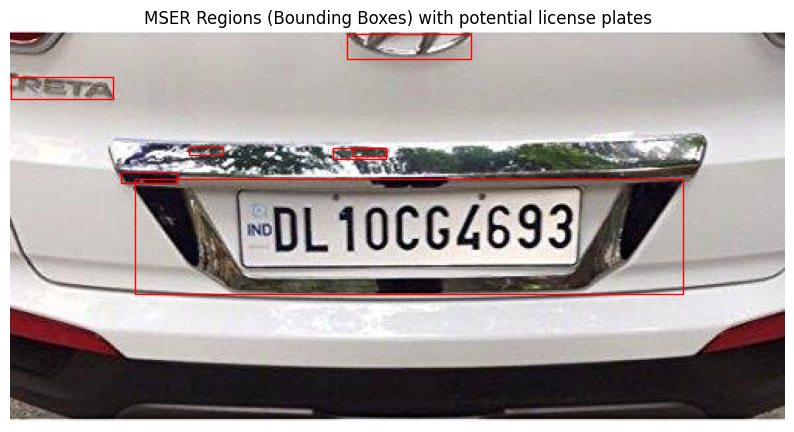

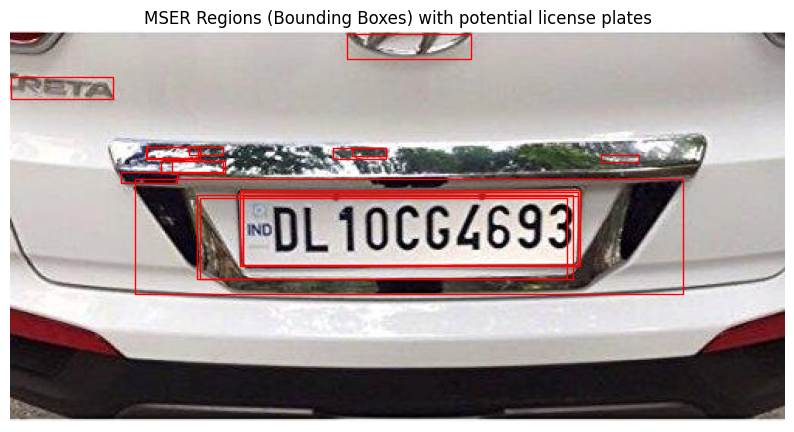

In [9]:
result1 = test_custom_different_passes()

Custom two-pass MSER time: 3.0376 seconds
Number of regions detected by custom two-pass MSER: 173
OpenCV MSER time: 0.0113 seconds
Number of regions detected by OpenCV MSER: 620
IoU between custom and OpenCV MSER regions: 0.7596


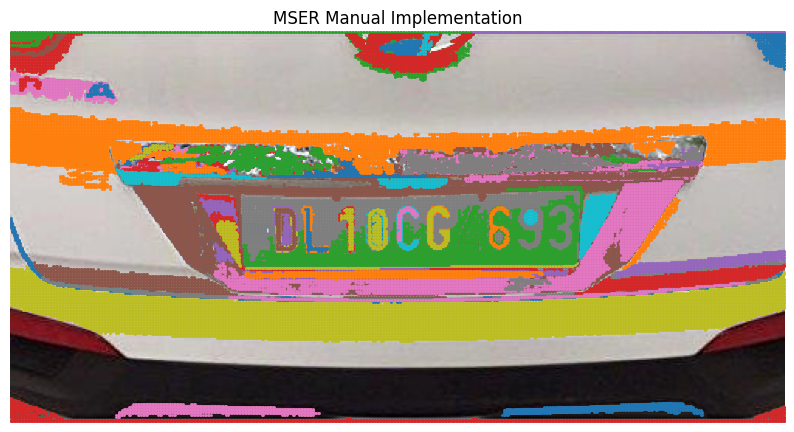

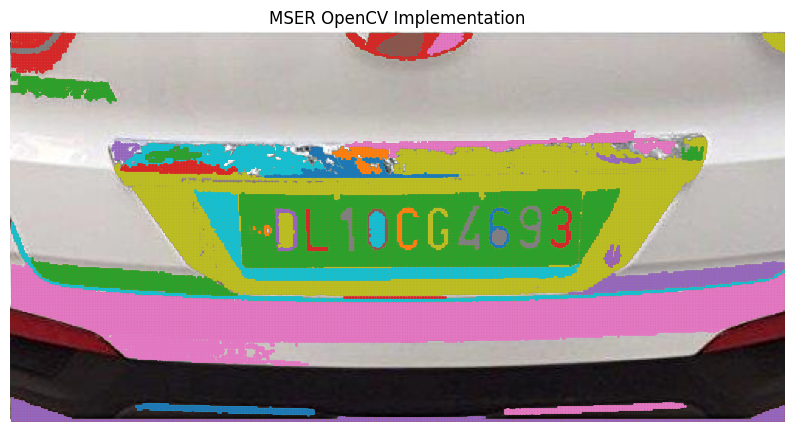

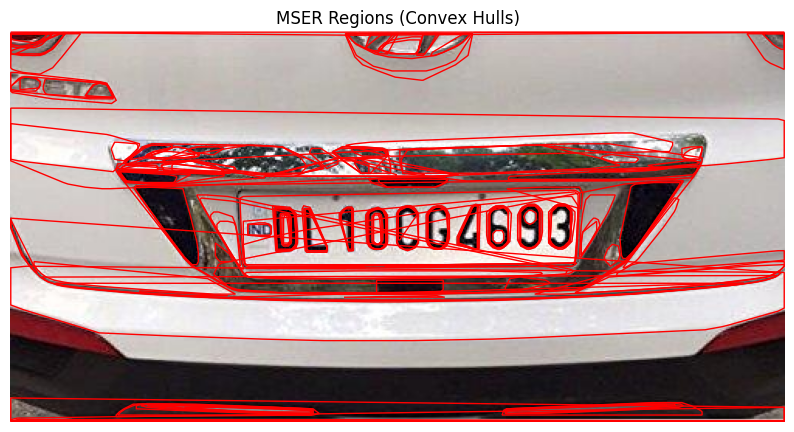

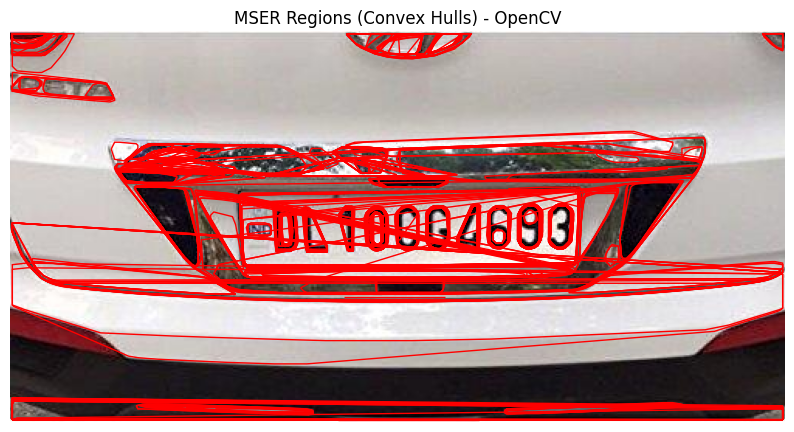

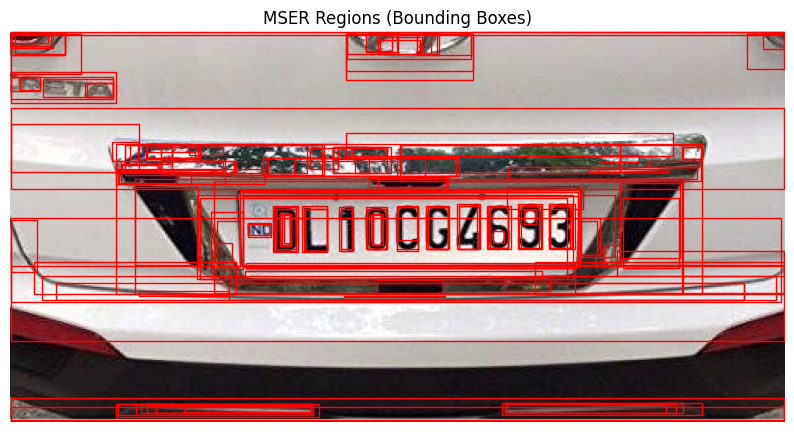

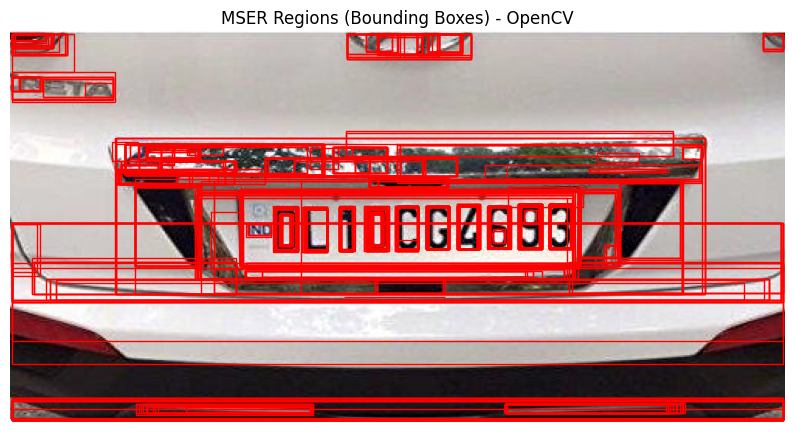

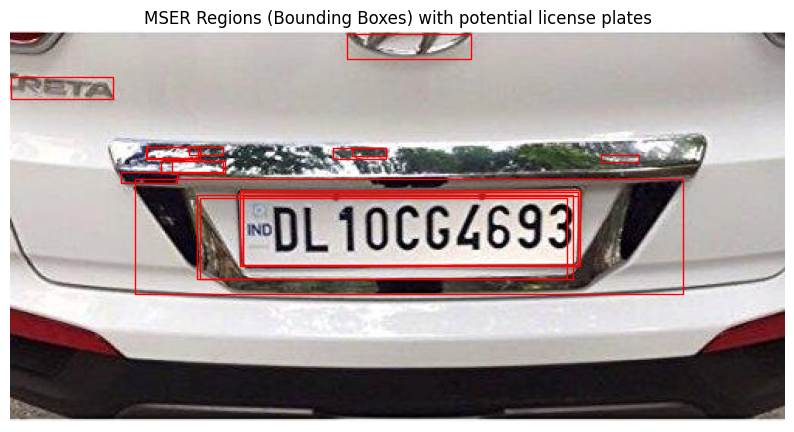

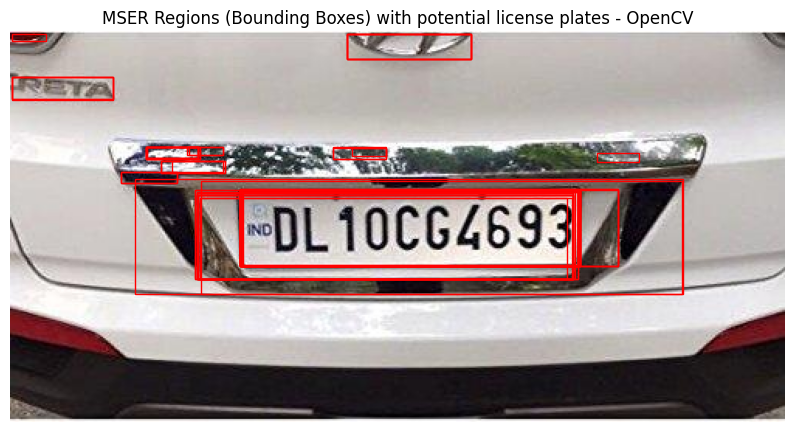

In [10]:
result2 = test_custom_opencv()

Custom two-pass MSER time with custom parameters: 3.4027 seconds
Number of regions detected by custom two-pass MSER with custom parameters: 127
OpenCV MSER time with custom parameters: 0.0096 seconds
Number of regions detected by OpenCV MSER with custom parameters: 370
IoU between custom and OpenCV MSER regions with custom parameters: 0.8650


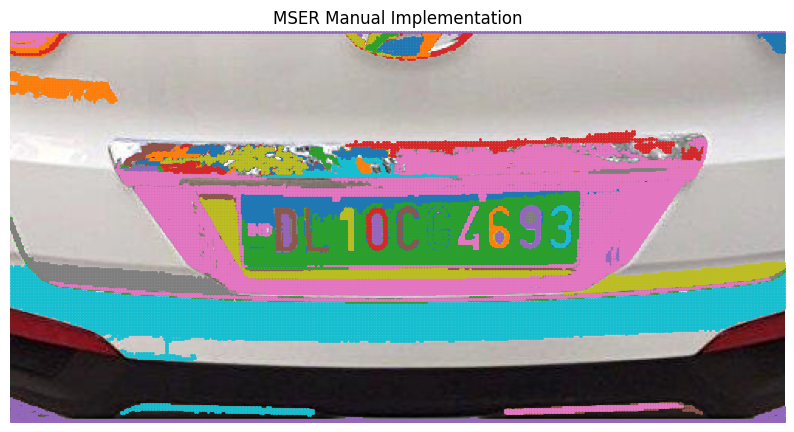

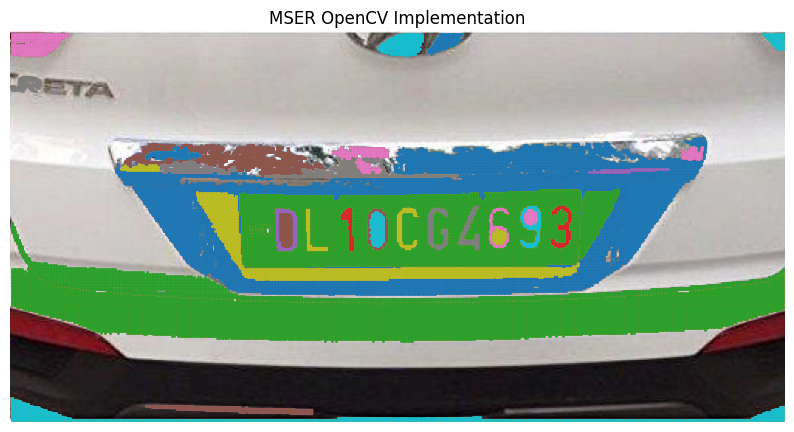

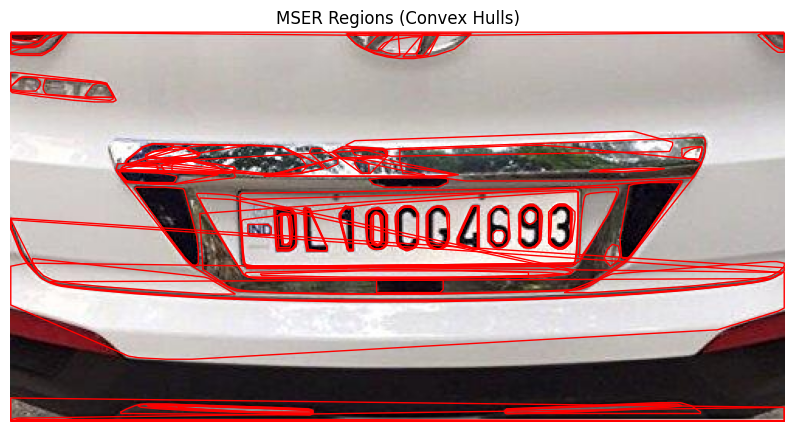

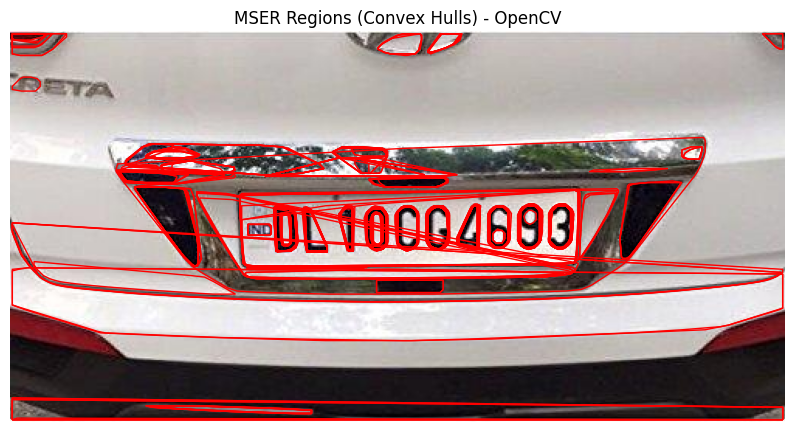

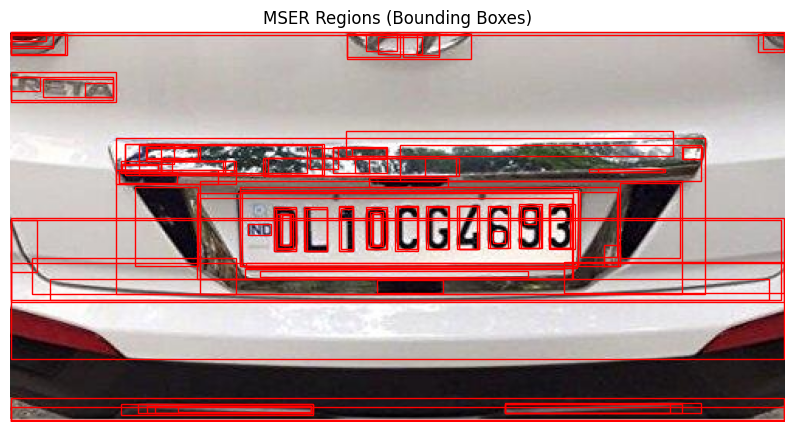

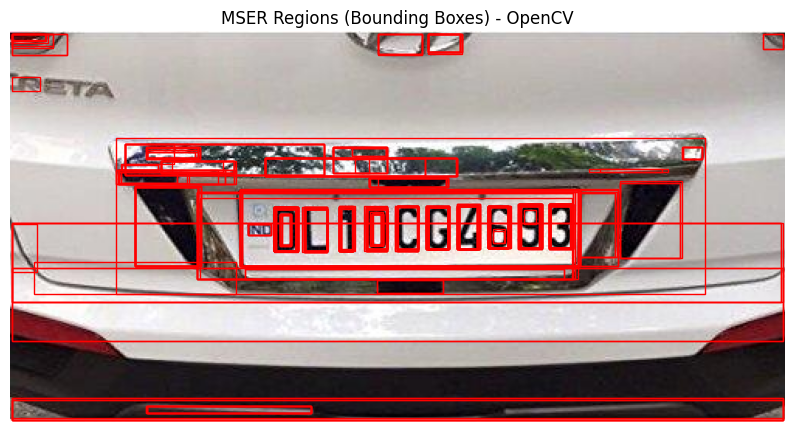

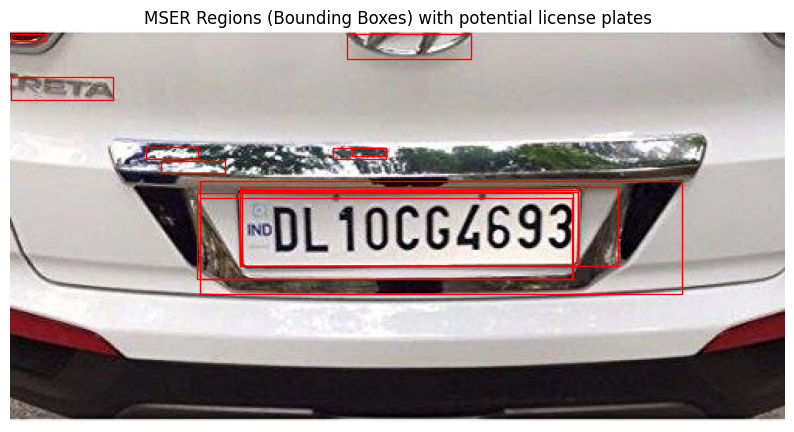

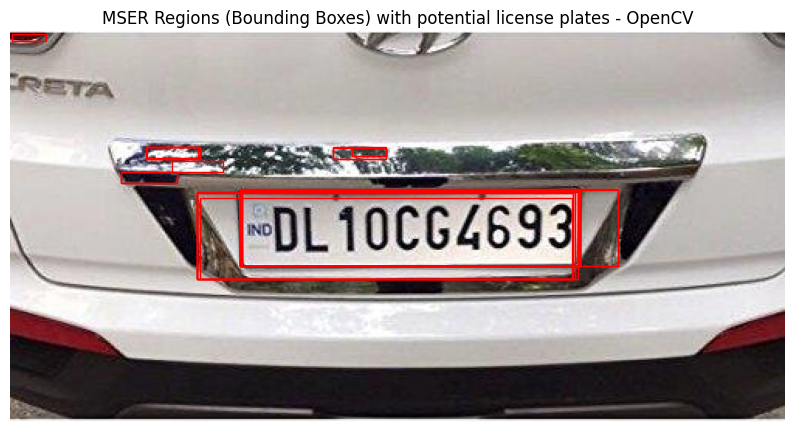

In [11]:
result3 = test_custom_parameters(delta=10, min_area=60, max_area=14400, max_variation=0.25, min_diversity=0.2)

In [12]:
print("Results of the tests: number of regions1, number of regions2, time1, time2, iou")
print("Test 1 (Custom different passes):", result1)
print("Test 2 (Custom vs OpenCV):", result2)
print("Test 3 (Custom parameters):", result3)

Results of the tests: number of regions1, number of regions2, time1, time2, iou
Test 1 (Custom different passes): (105, 173, 1.5144517421722412, 2.995377779006958, 0.36842659182599546)
Test 2 (Custom vs OpenCV): (173, 620, 3.03757905960083, 0.011284351348876953, 0.7595907928388747)
Test 3 (Custom parameters): (127, 370, 3.402665376663208, 0.009577035903930664, 0.8650221729490022)
